In [186]:
import numpy as np
import pandas as pd
import scipy
from scipy import stats
from scipy.stats import norm,t

import statsmodels
from statsmodels import stats
from statsmodels.stats import weightstats

import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.stats.multicomp
from statsmodels.stats.multicomp import pairwise_tukeyhsd

from statsmodels.stats import proportion
from scipy.stats import chisquare
from scipy.stats import chi2_contingency

import matplotlib
from matplotlib import pyplot as plt
import pylab
from pylab import plot, show, legend, show, title, xlabel, ylabel

import sklearn
from sklearn.model_selection import train_test_split

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

from statsmodels.discrete import discrete_model
from statsmodels.discrete.discrete_model import MNLogit

import mord
from mord import LogisticAT

import statsmodels.formula.api as smf
from statsmodels.discrete.discrete_model import Poisson as psn
from statsmodels.discrete.discrete_model import NegativeBinomial as nbm

import os
os.chdir(r'D:\Downloads')

from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.api import SimpleExpSmoothing
from statsmodels.tsa.api import ExponentialSmoothing, Holt
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA

import seaborn as sns

# Load and inspect the dataset.

In [187]:
df = pd.read_csv('data.csv')

In [188]:
df.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490


In [189]:
df.tail()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
6814,0,0.493687,0.539468,0.543230,0.604455,0.604462,0.998992,0.797409,0.809331,0.303510,...,0.799927,0.000466,0.623620,0.604455,0.840359,0.279606,0.027064,0.566193,1,0.029890
6815,0,0.475162,0.538269,0.524172,0.598308,0.598308,0.998992,0.797414,0.809327,0.303520,...,0.799748,0.001959,0.623931,0.598306,0.840306,0.278132,0.027009,0.566018,1,0.038284
6816,0,0.472725,0.533744,0.520638,0.610444,0.610213,0.998984,0.797401,0.809317,0.303512,...,0.797778,0.002840,0.624156,0.610441,0.840138,0.275789,0.026791,0.565158,1,0.097649
6817,0,0.506264,0.559911,0.554045,0.607850,0.607850,0.999074,0.797500,0.809399,0.303498,...,0.811808,0.002837,0.623957,0.607846,0.841084,0.277547,0.026822,0.565302,1,0.044009
6818,0,0.493053,0.570105,0.549548,0.627409,0.627409,0.998080,0.801987,0.813800,0.313415,...,0.815956,0.000707,0.626680,0.627408,0.841019,0.275114,0.026793,0.565167,1,0.233902


In [190]:
df.columns

Index(['Bankrupt?', ' ROA(C) before interest and depreciation before interest',
       ' ROA(A) before interest and % after tax',
       ' ROA(B) before interest and depreciation after tax',
       ' Operating Gross Margin', ' Realized Sales Gross Margin',
       ' Operating Profit Rate', ' Pre-tax net Interest Rate',
       ' After-tax net Interest Rate',
       ' Non-industry income and expenditure/revenue',
       ' Continuous interest rate (after tax)', ' Operating Expense Rate',
       ' Research and development expense rate', ' Cash flow rate',
       ' Interest-bearing debt interest rate', ' Tax rate (A)',
       ' Net Value Per Share (B)', ' Net Value Per Share (A)',
       ' Net Value Per Share (C)', ' Persistent EPS in the Last Four Seasons',
       ' Cash Flow Per Share', ' Revenue Per Share (Yuan ¥)',
       ' Operating Profit Per Share (Yuan ¥)',
       ' Per Share Net profit before tax (Yuan ¥)',
       ' Realized Sales Gross Profit Growth Rate',
       ' Operating Profit

In [191]:
df.dtypes

Bankrupt?                                                     int64
 ROA(C) before interest and depreciation before interest    float64
 ROA(A) before interest and % after tax                     float64
 ROA(B) before interest and depreciation after tax          float64
 Operating Gross Margin                                     float64
                                                             ...   
 Liability to Equity                                        float64
 Degree of Financial Leverage (DFL)                         float64
 Interest Coverage Ratio (Interest expense to EBIT)         float64
 Net Income Flag                                              int64
 Equity to Liability                                        float64
Length: 96, dtype: object

In [192]:
df.shape

(6819, 96)

In [193]:
duplicated_indices = df[df.duplicated()].index
duplicated_indices
# Identify indices of duplicated rows

Index([], dtype='int64')

# Handle missing values appropriately.

In [194]:
null_indices = df[df.isnull().any(axis=1)].index
null_indices
# Identify indices of rows with null values

Index([], dtype='int64')

# Detect and handle outliers.

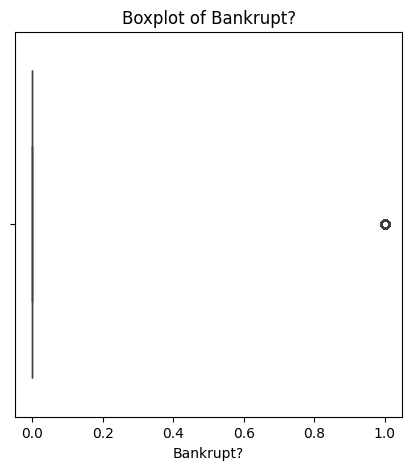

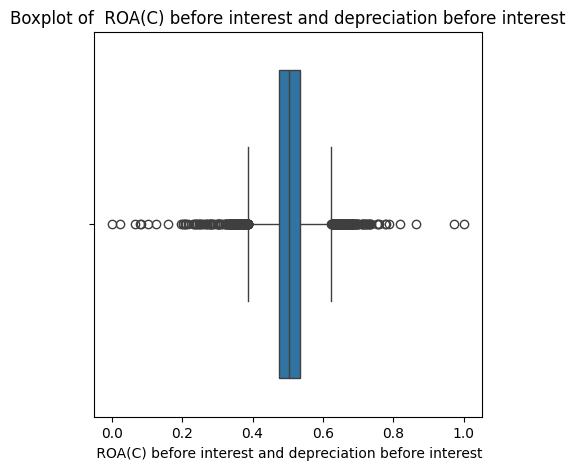

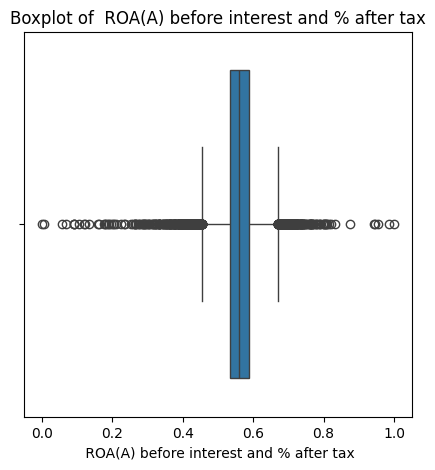

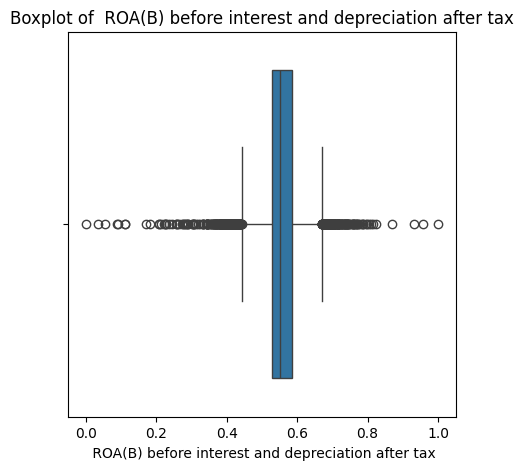

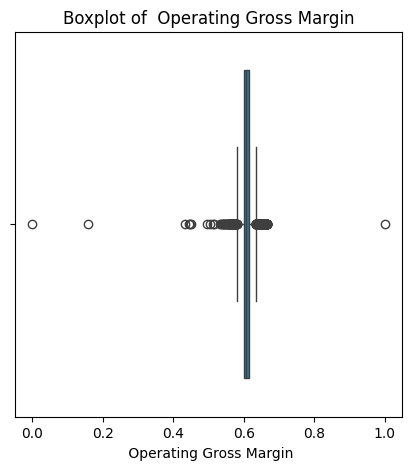

...

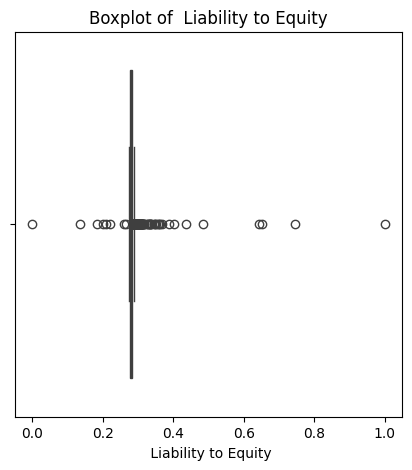

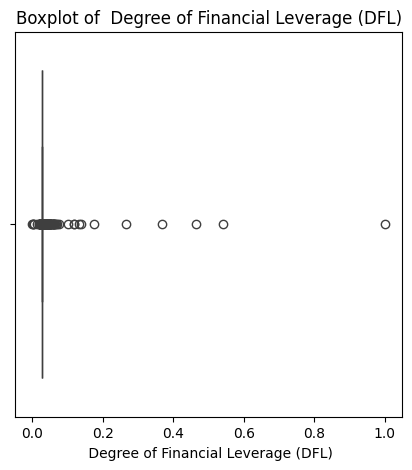

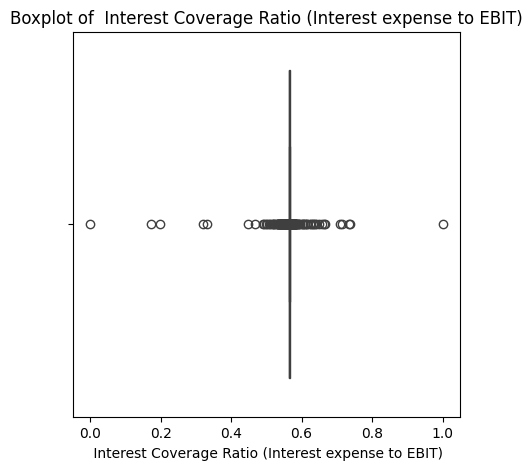

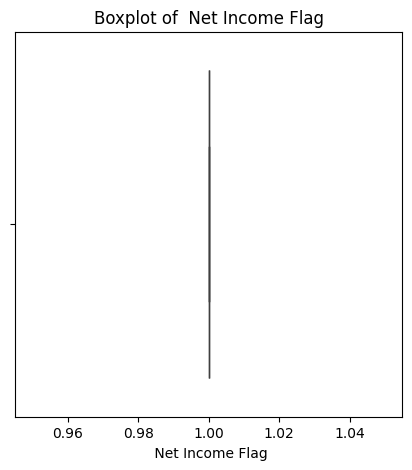

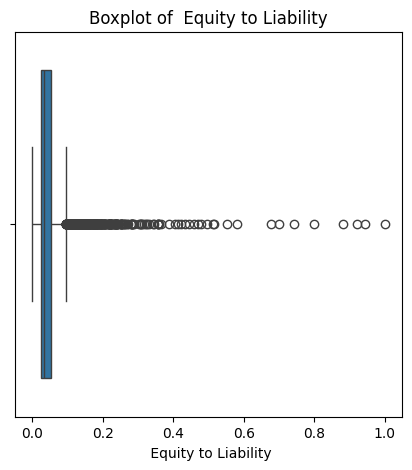

In [195]:
# Iterate over each column in the DataFrame
for column in df.columns:
    # Create a boxplot for the column
    plt.figure(figsize=(5, 5))
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}')
    plt.xlabel(column)
    plt.show()

In [197]:
Q1 = numeric_df.quantile(0.25)
# Calculate the first quartile (25th percentile)
Q3 = numeric_df.quantile(0.75)
# Calculate the third quartile (75th percentile)
IQR = Q3 - Q1
# Calculate the interquartile range (IQR) as the difference between Q3 and Q1
print(IQR)

Bankrupt?                                                   0.000000
 ROA(C) before interest and depreciation before interest    0.059036
 ROA(A) before interest and % after tax                     0.053614
 ROA(B) before interest and depreciation after tax          0.056829
 Operating Gross Margin                                     0.013469
                                                              ...   
 Liability to Equity                                        0.004505
 Degree of Financial Leverage (DFL)                         0.000122
 Interest Coverage Ratio (Interest expense to EBIT)         0.000566
 Net Income Flag                                            0.000000
 Equity to Liability                                        0.028361
Length: 96, dtype: float64


In [96]:
df.shape

(6819, 96)

In [198]:
def impute_outliers(df, column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # Replace outliers with bounds
    df.loc[df[column] < lower_bound, column] = lower_bound
    df.loc[df[column] > upper_bound, column] = upper_bound

    return df
    
# List of columns to impute (excluding 'Bankrupt?')
columns_to_impute = df.columns.difference(['Bankrupt?','Current Liability to Current Assets','Net Income Flag'])

# Apply the imputation function to each column
for column in columns_to_impute:
    df = impute_outliers(df, column)

In [99]:
df.shape

(6819, 96)

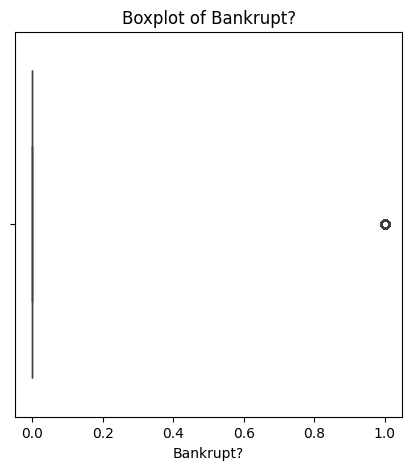

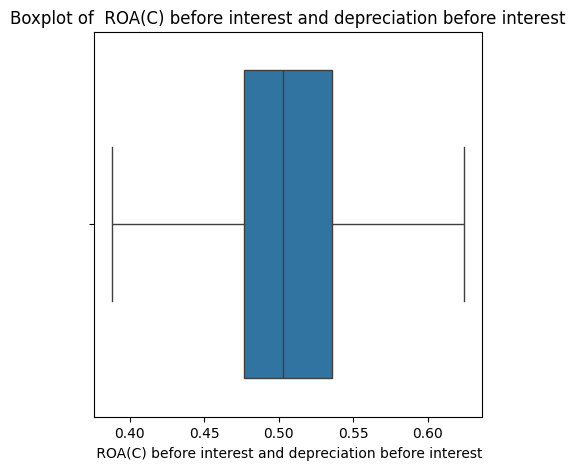

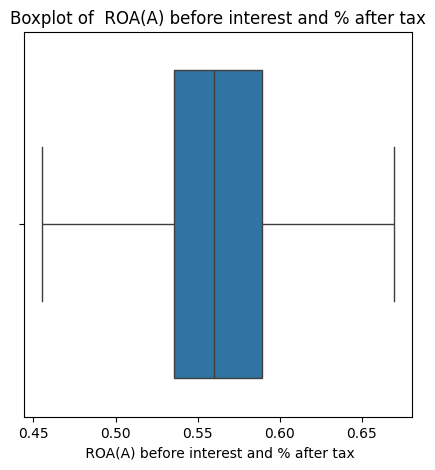

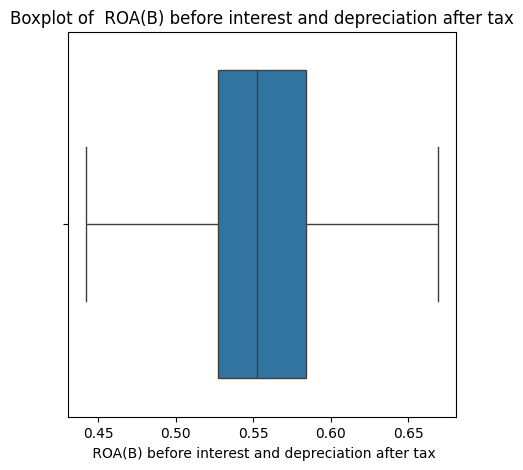

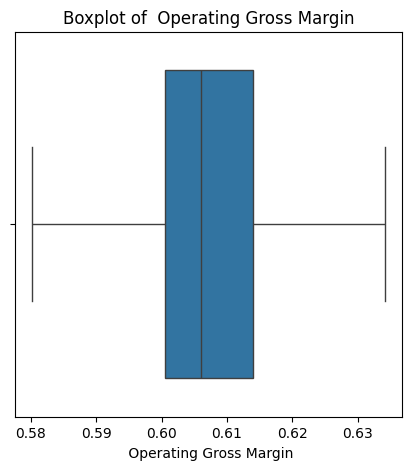

...

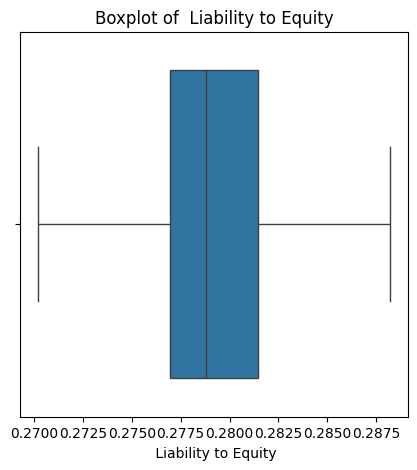

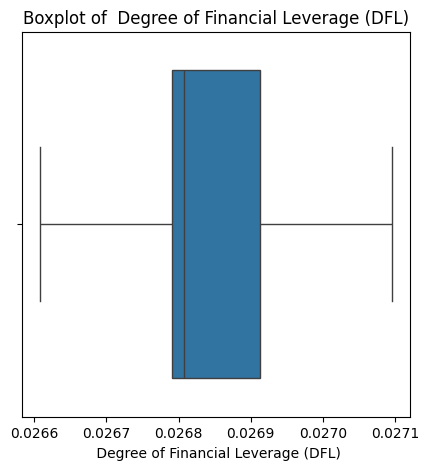

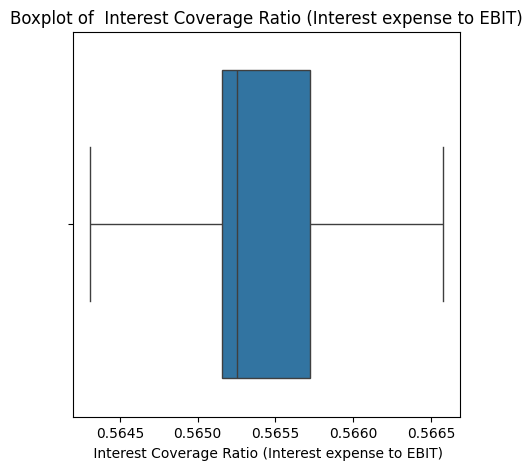

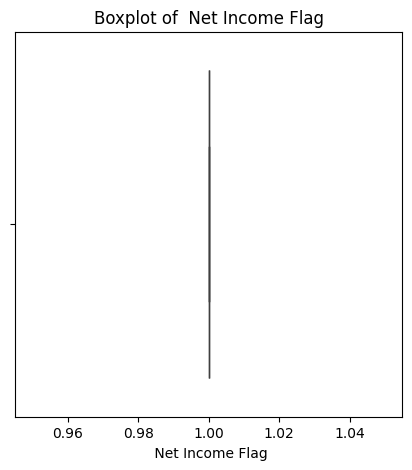

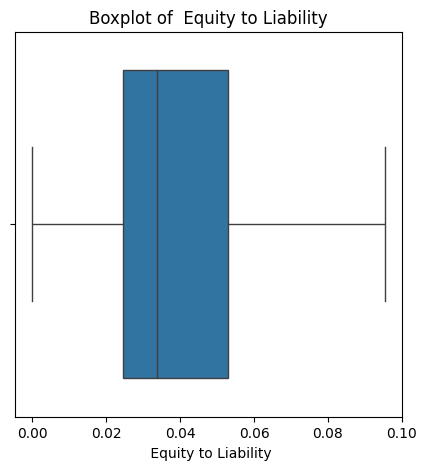

In [199]:
for column in df.columns:
    plt.figure(figsize=(5, 5))
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}')
    plt.xlabel(column)
    plt.show()

# Generate descriptive statistics.

In [200]:
df.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505667,0.560507,0.554691,0.607834,0.607812,0.999028,0.797467,0.809378,0.303526,...,0.810070,0.003750,0.623890,0.607833,0.841060,0.279689,0.026846,0.565422,1.0,0.042019
std,0.176710,0.051483,0.050087,0.050277,0.010758,0.010725,0.000120,0.000189,0.000157,0.000124,...,0.027735,0.003805,0.000553,0.010758,0.002057,0.003566,0.000138,0.000627,0.0,0.023671
min,0.000000,0.387973,0.455122,0.442034,0.580240,0.580321,0.998781,0.797096,0.809075,0.303288,...,0.752193,0.000000,0.622838,0.580237,0.836752,0.270187,0.026608,0.564309,1.0,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.796750,0.000904,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.810619,0.002085,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.826455,0.005270,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,1.000000,0.624116,0.669579,0.669348,0.634118,0.633954,0.999282,0.797868,0.809706,0.303764,...,0.871012,0.011819,0.624966,0.634119,0.845720,0.288207,0.027096,0.566574,1.0,0.095380


# Visualize feature distributions and target variable.

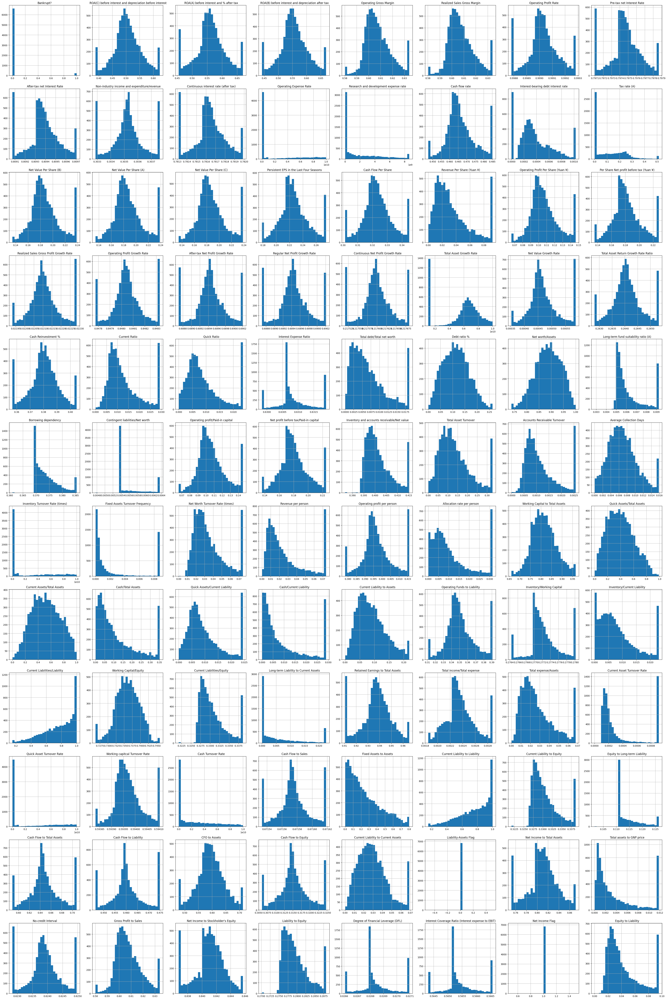

In [113]:
df.hist(bins=30, figsize=(40, 60), layout=(12, 8))
# Generate histograms for all numerical columns in df
plt.tight_layout()
plt.show()

In [109]:
df['Bankrupt?'].value_counts()

Bankrupt?
0    6599
1     220
Name: count, dtype: int64

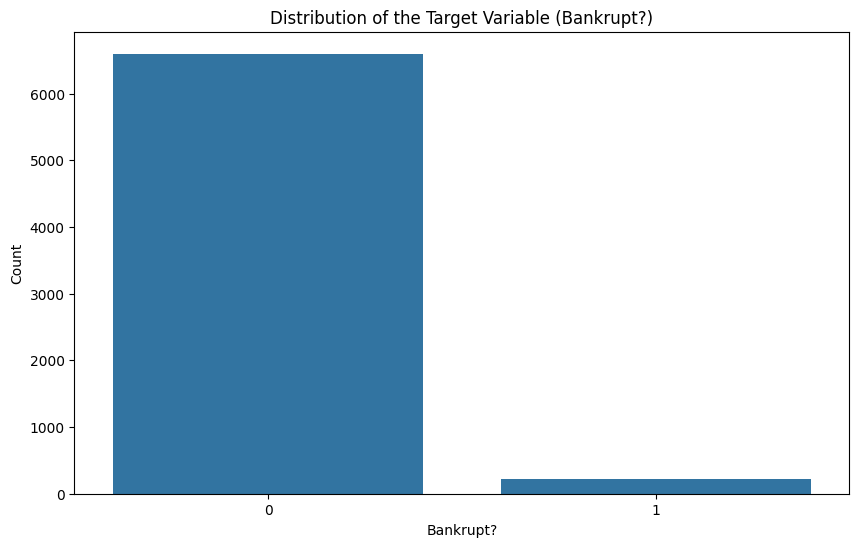

In [110]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Bankrupt?', data=df)
# Create a count plot using Seaborn, where x-axis represents the 'Bankrupt?' column from the DataFrame 'df'
plt.title('Distribution of the Target Variable (Bankrupt?)')
plt.xlabel('Bankrupt?')
plt.ylabel('Count')
plt.show()

In [201]:
bankrupt_df = df[df['Bankrupt?'] == 1]
non_bankrupt_df = df[df['Bankrupt?'] == 0]

# Function to perform t-test for numerical features
def t_test_features(df, target_column):
    numerical_columns = df.select_dtypes(include=[np.number]).columns
    significant_features = []

    for column in numerical_columns:
        if column == target_column:
            continue
        t_stat, p_value = ttest_ind(bankrupt_df[column], non_bankrupt_df[column], nan_policy='omit')
        if p_value < 0.05:
            significant_features.append((column, p_value))
            print(f"Feature: {column} | p-value: {p_value}")

    return significant_features

# Function to perform chi-square test for categorical features (if any)
def chi_square_test_features(df, target_column):
    categorical_columns = df.select_dtypes(include=['object', 'category']).columns
    significant_features = []

    for column in categorical_columns:
        contingency_table = pd.crosstab(df[column], df[target_column])
        chi2, p_value, _, _ = chi2_contingency(contingency_table)
        if p_value < 0.05:
            significant_features.append((column, p_value))
            print(f"Feature: {column} | p-value: {p_value}")

    return significant_features

# Perform t-tests on numerical features
significant_numerical_features = t_test_features(df, 'Bankrupt?')

# Perform chi-square tests on categorical features
significant_categorical_features = chi_square_test_features(df, 'Bankrupt?')

# Summary of significant features
print("\nSignificant Numerical Features influencing Bankruptcy:")
count=0
for feature, p_value in significant_numerical_features:
    print(f"Feature: {feature} | p-value: {p_value}")
    count+=1
print(count)
print(sig)

print("\nSignificant Categorical Features influencing Bankruptcy:")
for feature, p_value in significant_categorical_features:
    print(f"Feature: {feature} | p-value: {p_value}")

Feature:  ROA(C) before interest and depreciation before interest | p-value: 1.348045717035517e-89
Feature:  ROA(A) before interest and % after tax | p-value: 1.4534246432788989e-89
Feature:  ROA(B) before interest and depreciation after tax | p-value: 1.8675125095406005e-91
Feature:  Operating Gross Margin | p-value: 3.282372473295665e-31
Feature:  Realized Sales Gross Margin | p-value: 6.967918440016324e-31
Feature:  Operating Profit Rate | p-value: 9.862984755119691e-59
Feature:  Pre-tax net Interest Rate | p-value: 1.8305036551524322e-88
Feature:  After-tax net Interest Rate | p-value: 1.4945490553988814e-89
Feature:  Non-industry income and expenditure/revenue | p-value: 8.371134084534355e-72
Feature:  Continuous interest rate (after tax) | p-value: 1.467797448577742e-96
Feature:  Research and development expense rate | p-value: 0.04086666500300871
Feature:  Cash flow rate | p-value: 2.2773201551338549e-23
Feature:  Interest-bearing debt interest rate | p-value: 5.290650012496292e

C:\Users\amash\AppData\Roaming\Python\Python312\site-packages\scipy\stats\_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


NameError: name 'sig' is not defined

In [202]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Compute the correlation matrix
corr_matrix = df.corr()

# Correlation with the target variable ('Bankrupt?')
corr_with_target = corr_matrix['Bankrupt?'].sort_values(ascending=False)

# Print the correlations
print(corr_with_target)

Bankrupt?                                   1.000000
 Borrowing dependency                       0.278367
 Total debt/Total net worth                 0.272914
 Debt ratio %                               0.246535
 Liability to Equity                        0.246176
                                              ...   
 Retained Earnings to Total Assets         -0.255218
 Net Income to Total Assets                -0.255797
 Persistent EPS in the Last Four Seasons   -0.256159
 Liability-Assets Flag                           NaN
 Net Income Flag                                 NaN
Name: Bankrupt?, Length: 96, dtype: float64


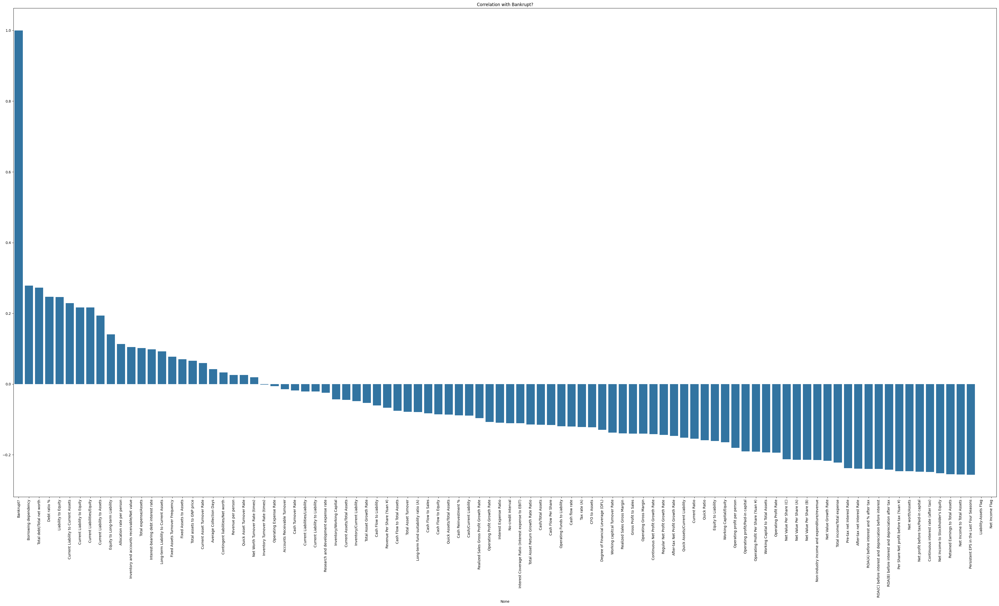

In [203]:
# Plot the correlations
plt.figure(figsize=(50, 25))
sns.barplot(x=corr_with_target.index, y=corr_with_target.values)
plt.xticks(rotation=90)
plt.title('Correlation with Bankrupt?')
plt.show()

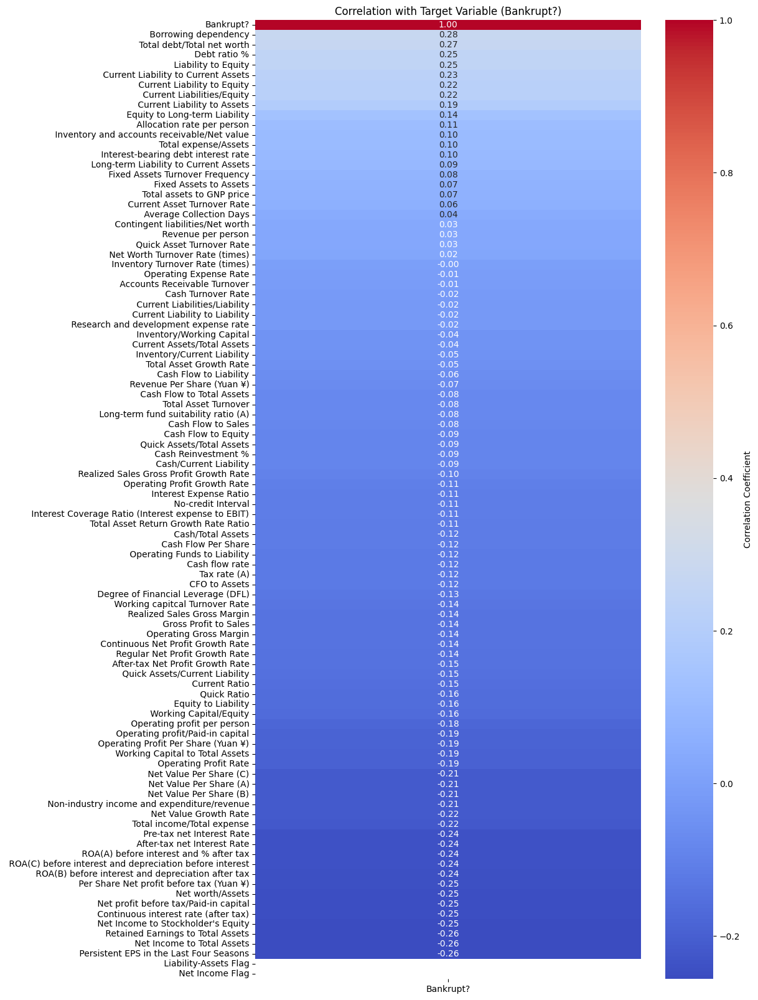

In [206]:
#ALTERNATIVE WAY TO PLOT

# Calculate the correlation
correlation_matrix = df.corr()
# Extract the correlation of each feature with the target variable
target_correlation = correlation_matrix['Bankrupt?'].sort_values(ascending=False)

# Plot the correlations with the target variable
plt.figure(figsize=(10, 20))
sns.heatmap(target_correlation.to_frame(), annot=True, fmt=".2f", cmap='coolwarm', cbar_kws={'label': 'Correlation Coefficient'})
plt.title('Correlation with Target Variable (Bankrupt?)')
plt.show()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
Bankrupt?,1.000000,-0.239543,-0.239500,-0.241993,-0.140042,-0.139272,-0.193856,-0.238036,-0.239484,-0.214506,...,-0.255797,0.065817,-0.110684,-0.140041,-0.251917,0.246176,-0.129292,-0.110761,NaN,-0.161036
ROA(C) before interest and depreciation before interest,-0.239543,1.000000,0.941564,0.988614,0.471126,0.468962,0.794920,0.823454,0.810364,0.410102,...,0.930357,-0.007035,0.162347,0.471121,0.890314,-0.258969,0.111443,0.099427,NaN,0.185974
ROA(A) before interest and % after tax,-0.239500,0.941564,1.000000,0.952666,0.471641,0.469330,0.796013,0.876436,0.877649,0.505969,...,0.990799,0.000936,0.174670,0.471638,0.952613,-0.254115,0.153120,0.140903,NaN,0.186650
ROA(B) before interest and depreciation after tax,-0.241993,0.988614,0.952666,1.000000,0.481338,0.479152,0.800215,0.829183,0.831419,0.412237,...,0.942100,0.004209,0.153183,0.481333,0.900832,-0.263275,0.126218,0.115781,NaN,0.191511
Operating Gross Margin,-0.140042,0.471126,0.471641,0.481338,1.000000,0.999262,0.636798,0.542617,0.543807,0.108015,...,0.479768,-0.190797,0.083487,1.000000,0.426141,-0.336175,0.012177,0.000099,NaN,0.377930
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Liability to Equity,0.246176,-0.258969,-0.254115,-0.263275,-0.336175,-0.336713,-0.215333,-0.300301,-0.300023,-0.271459,...,-0.297587,0.124385,-0.307483,-0.336172,-0.204635,1.000000,0.119887,0.150937,NaN,-0.787970
Degree of Financial Leverage (DFL),-0.129292,0.111443,0.153120,0.126218,0.012177,0.012095,0.150584,0.191819,0.202088,0.161351,...,0.152773,0.042743,-0.063156,0.012178,0.227649,0.119887,1.000000,0.904464,NaN,-0.169646
Interest Coverage Ratio (Interest expense to EBIT),-0.110761,0.099427,0.140903,0.115781,0.000099,-0.000544,0.139218,0.171559,0.182419,0.139235,...,0.136774,0.057851,-0.084002,0.000103,0.207104,0.150937,0.904464,1.000000,NaN,-0.189878
Net Income Flag,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


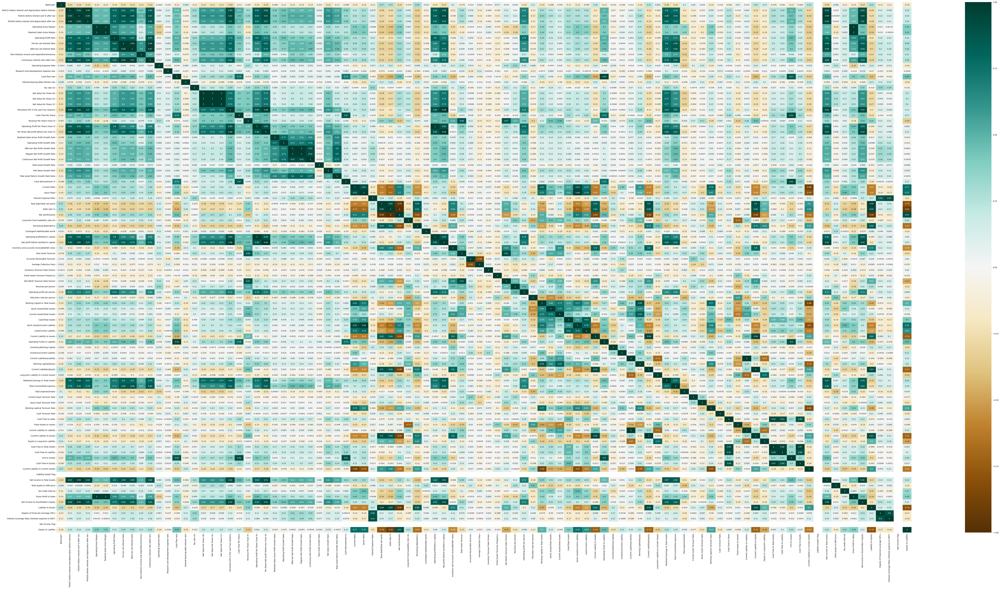

In [118]:
plt.figure(figsize=(100,50))
corr = df.corr()
sns.heatmap(corr, cmap="BrBG",annot=True)
corr

In [207]:
corr_matrix = df.corr()
threshold = 0.2
# Set threshold for correlation selection
corr_with_target = corr_matrix['Bankrupt?'].abs()
# Calculate absolute correlation with the target variable ('Bankrupt?')
relevant_features = corr_with_target[corr_with_target > threshold].index.tolist()
# Select features with correlation above the threshold
df1 = df[relevant_features]
# Create a new dataframe with selected features
df1

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Net Value Per Share (B),Net Value Per Share (A),...,Borrowing dependency,Net profit before tax/Paid-in capital,Current Liabilities/Equity,Retained Earnings to Total Assets,Total income/Total expense,Current Liability to Equity,Current Liability to Current Assets,Net Income to Total Assets,Net Income to Stockholder's Equity,Liability to Equity
0,1,0.387973,0.455122,0.442034,0.797096,0.809075,0.303288,0.781314,0.147950,0.147950,...,0.385425,0.137757,0.338662,0.910524,0.002022,0.338662,0.068886,0.752193,0.836752,0.288207
1,1,0.464291,0.538214,0.516730,0.797380,0.809301,0.303556,0.781506,0.182251,0.182251,...,0.376760,0.168962,0.329740,0.931065,0.002226,0.329740,0.047775,0.795297,0.839969,0.283846
2,1,0.426071,0.499019,0.472295,0.797096,0.809075,0.303288,0.781314,0.177911,0.177911,...,0.379093,0.148036,0.334777,0.910524,0.002060,0.334777,0.025346,0.774670,0.836774,0.288207
3,1,0.399844,0.455122,0.457733,0.797096,0.809075,0.303350,0.781314,0.154187,0.154187,...,0.379743,0.147561,0.331509,0.910524,0.001851,0.331509,0.067250,0.752193,0.836752,0.281721
4,1,0.465022,0.538432,0.522298,0.797366,0.809304,0.303475,0.781550,0.167502,0.167502,...,0.375025,0.167461,0.330726,0.913850,0.002224,0.330726,0.047725,0.795016,0.839973,0.278514
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6814,0,0.493687,0.539468,0.543230,0.797409,0.809331,0.303510,0.781588,0.175045,0.175045,...,0.373823,0.171111,0.330914,0.925611,0.002266,0.330914,0.027951,0.799927,0.840359,0.279606
6815,0,0.475162,0.538269,0.524172,0.797414,0.809327,0.303520,0.781586,0.181324,0.181324,...,0.372505,0.171805,0.329753,0.932629,0.002288,0.329753,0.031470,0.799748,0.840306,0.278132
6816,0,0.472725,0.533744,0.520638,0.797401,0.809317,0.303512,0.781546,0.238507,0.238507,...,0.369637,0.172287,0.326921,0.932000,0.002239,0.326921,0.007542,0.797778,0.840138,0.275789
6817,0,0.506264,0.559911,0.554045,0.797500,0.809399,0.303498,0.781663,0.213392,0.213392,...,0.369649,0.182498,0.329294,0.939613,0.002395,0.329294,0.022916,0.811808,0.841084,0.277547


In [212]:
df1.shape

(6819, 27)

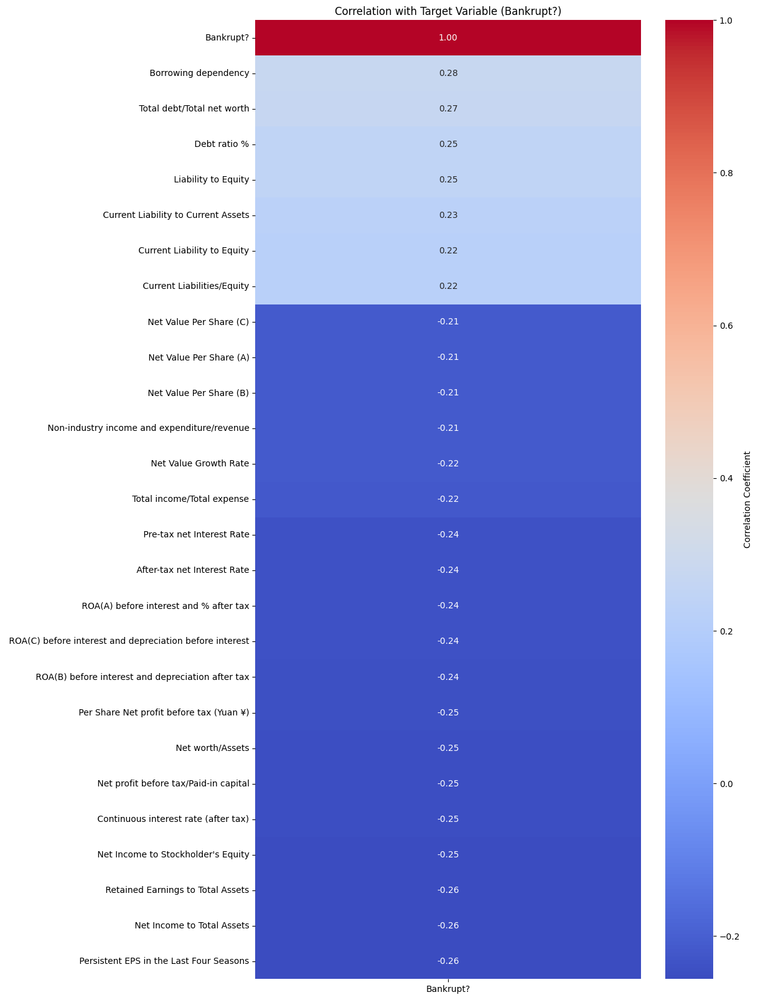

In [208]:
correlation_matrix = df1.corr()
target_correlation = correlation_matrix['Bankrupt?'].sort_values(ascending=False)

plt.figure(figsize=(10, 20))
sns.heatmap(target_correlation.to_frame(), annot=True, fmt=".2f", cmap='coolwarm', cbar_kws={'label': 'Correlation Coefficient'})
plt.title('Correlation with Target Variable (Bankrupt?)')
plt.show()

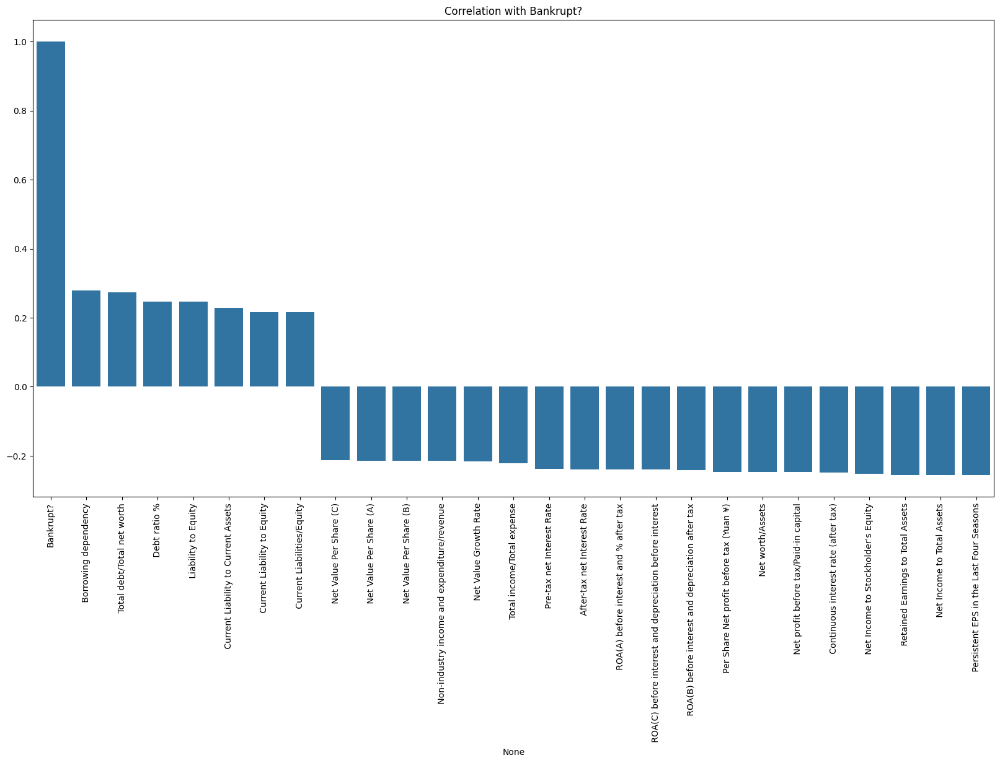

In [209]:
corr_matrix1 = df1.corr()
corr_with_target1 = corr_matrix1['Bankrupt?'].sort_values(ascending=False)

plt.figure(figsize=(20, 10))
sns.barplot(x=corr_with_target1.index, y=corr_with_target1.values)
plt.xticks(rotation=90)
plt.title('Correlation with Bankrupt?')
plt.show()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Net Value Per Share (B),Net Value Per Share (A),...,Borrowing dependency,Net profit before tax/Paid-in capital,Current Liabilities/Equity,Retained Earnings to Total Assets,Total income/Total expense,Current Liability to Equity,Current Liability to Current Assets,Net Income to Total Assets,Net Income to Stockholder's Equity,Liability to Equity
Bankrupt?,1.000000,-0.239543,-0.239500,-0.241993,-0.238036,-0.239484,-0.214506,-0.248585,-0.214143,-0.213725,...,0.278367,-0.247467,0.216619,-0.255218,-0.221799,0.216619,0.229231,-0.255797,-0.251917,0.246176
ROA(C) before interest and depreciation before interest,-0.239543,1.000000,0.941564,0.988614,0.823454,0.810364,0.410102,0.836030,0.588946,0.588611,...,-0.311573,0.879985,-0.231259,0.804321,0.775651,-0.231259,-0.269303,0.930357,0.890314,-0.258969
ROA(A) before interest and % after tax,-0.239500,0.941564,1.000000,0.952666,0.876436,0.877649,0.505969,0.867825,0.632623,0.632445,...,-0.331452,0.921472,-0.208058,0.855882,0.834337,-0.208058,-0.312334,0.990799,0.952613,-0.254115
ROA(B) before interest and depreciation after tax,-0.241993,0.988614,0.952666,1.000000,0.829183,0.831419,0.412237,0.858169,0.590792,0.590570,...,-0.310342,0.869560,-0.237615,0.807971,0.786189,-0.237615,-0.275232,0.942100,0.900832,-0.263275
Pre-tax net Interest Rate,-0.238036,0.823454,0.876436,0.829183,1.000000,0.987637,0.604489,0.961856,0.599166,0.599243,...,-0.317517,0.808012,-0.274342,0.801705,0.859120,-0.274342,-0.311862,0.885762,0.836014,-0.300301
After-tax net Interest Rate,-0.239484,0.810364,0.877649,0.831419,0.987637,1.000000,0.601597,0.968825,0.594564,0.594696,...,-0.311366,0.792706,-0.276490,0.796113,0.862401,-0.276490,-0.313701,0.889530,0.841590,-0.300023
Non-industry income and expenditure/revenue,-0.214506,0.410102,0.505969,0.412237,0.604489,0.601597,1.000000,0.537608,0.408860,0.408844,...,-0.316844,0.494812,-0.247486,0.495126,0.566332,-0.247486,-0.209411,0.526756,0.505236,-0.271459
Continuous interest rate (after tax),-0.248585,0.836030,0.867825,0.858169,0.961856,0.968825,0.537608,1.000000,0.594596,0.594742,...,-0.309333,0.788940,-0.265769,0.792237,0.844985,-0.265769,-0.310381,0.876598,0.830559,-0.293661
Net Value Per Share (B),-0.214143,0.588946,0.632623,0.590792,0.599166,0.594564,0.408860,0.594596,1.000000,0.999685,...,-0.311011,0.746513,-0.239342,0.766730,0.640587,-0.239342,-0.256526,0.637903,0.619449,-0.266413
Net Value Per Share (A),-0.213725,0.588611,0.632445,0.590570,0.599243,0.594696,0.408844,0.594742,0.999685,1.000000,...,-0.311734,0.745822,-0.240170,0.766915,0.640540,-0.240170,-0.257635,0.637742,0.619532,-0.267166


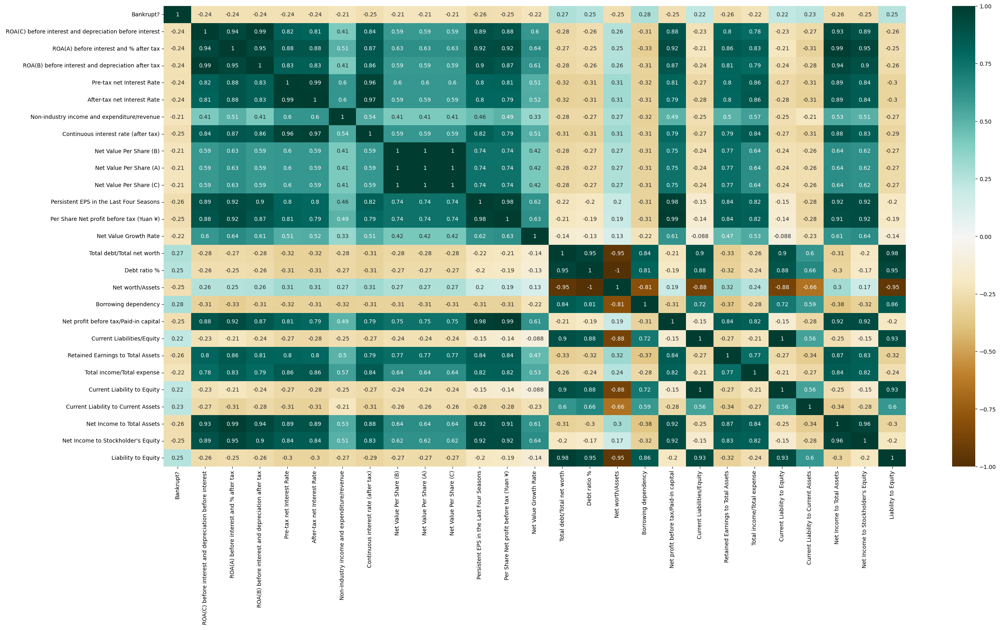

In [210]:
plt.figure(figsize=(30,15))
corr1 = df1.corr()
sns.heatmap(corr1, cmap="BrBG",annot=True)
corr1

# Split the data into training and testing sets.

In [213]:
from sklearn.model_selection import train_test_split

# Splitting data into training (80%) and testing (20%) sets
x_train, x_test, y_train, y_test = train_test_split(df1.drop(columns=['Bankrupt?']), df1['Bankrupt?'], test_size=0.2, random_state=42)

Accuracy: 0.843841642228739
Precision: 0.17338709677419356
Recall: 0.8431372549019608
F1 Score: 0.28762541806020064

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.84      0.91      1313
           1       0.17      0.84      0.29        51

    accuracy                           0.84      1364
   macro avg       0.58      0.84      0.60      1364
weighted avg       0.96      0.84      0.89      1364



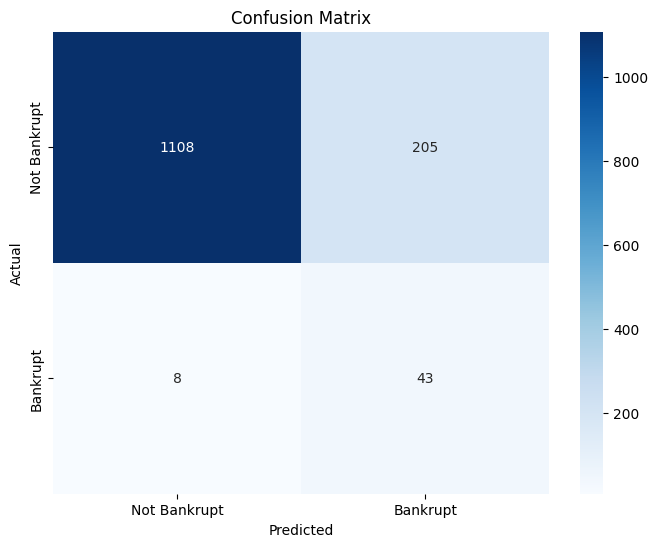

In [215]:
from imblearn.over_sampling import SMOTE

# Apply SMOTE to the training data
sm = SMOTE(random_state=42)
x_train_res, y_train_res = sm.fit_resample(x_train, y_train)

# Initialize Logistic Regression model
model = LogisticRegression(random_state=42, max_iter=1000)

# Fit the model on the resampled training data
model.fit(x_train_res, y_train_res)

# Predict on the testing data
y_pred = model.predict(x_test)

# Calculate performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print performance metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Bankrupt', 'Bankrupt'], yticklabels=['Not Bankrupt', 'Bankrupt'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

classification model shows strong accuracy overall (84.38%), driven by excellent performance in predicting non-bankrupt cases (class 0). However, it struggles with bankrupt cases (class 1), reflected in low precision (17.34%) and F1 score (28.76%), despite decent recall (84.31%). This disparity underscores the impact of class imbalance (1313 vs. 51 instances)

In [217]:
y_train_res.value_counts()

Bankrupt?
0    5286
1    5286
Name: count, dtype: int64

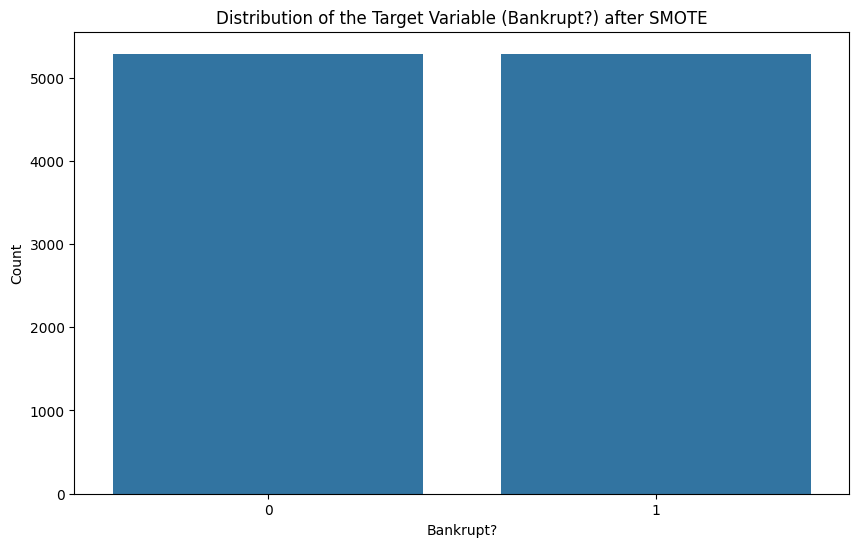

In [218]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plotting the distribution of the target variable after SMOTE
plt.figure(figsize=(10, 6))
sns.countplot(x=y_train_res, data=df1)
plt.title('Distribution of the Target Variable (Bankrupt?) after SMOTE')
plt.xlabel('Bankrupt?')
plt.ylabel('Count')
plt.show()

In [168]:
import seaborn as sns
import matplotlib.pyplot as plt

In [220]:
df_bankrupt = df1[df1['Bankrupt?'] == 1]  # Subset of bankrupt companies
df_non_bankrupt = df1[df1['Bankrupt?'] == 0]  # Subset of non-bankrupt companies

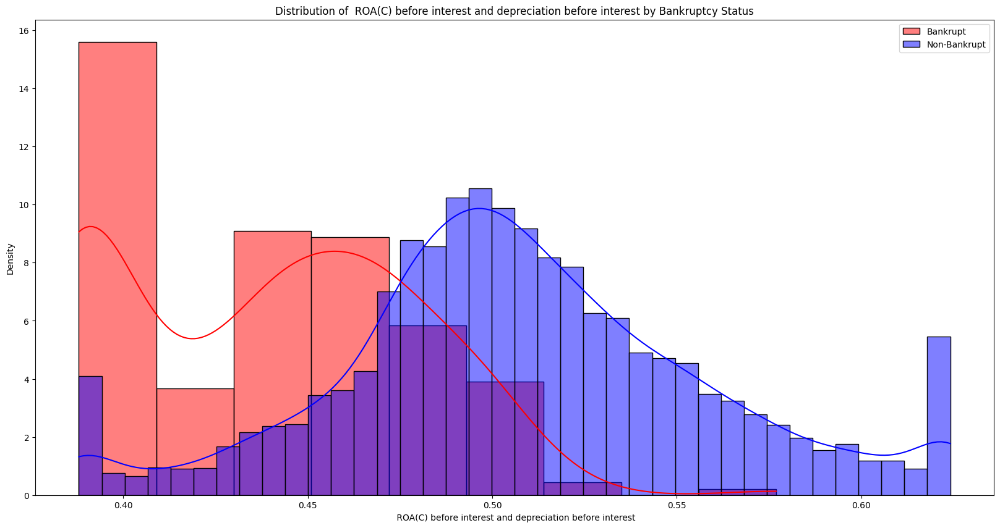

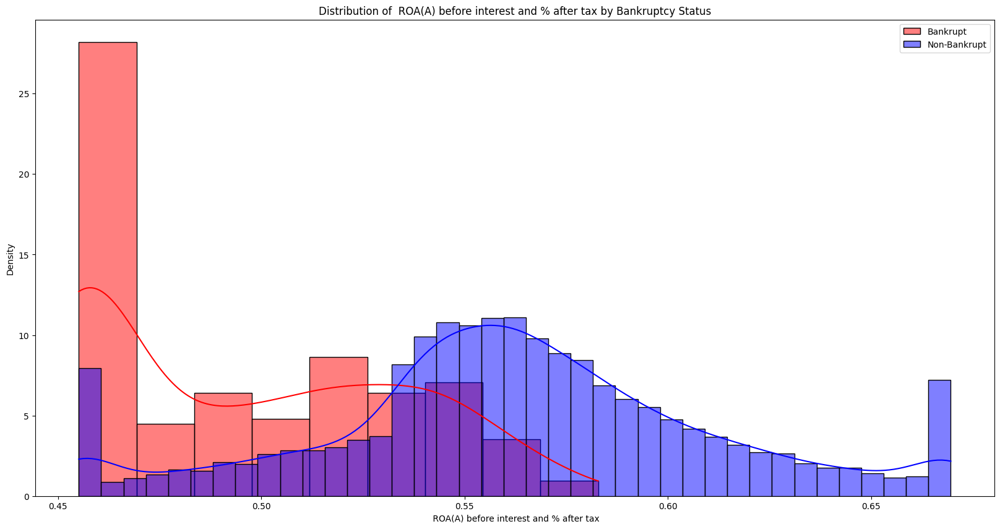

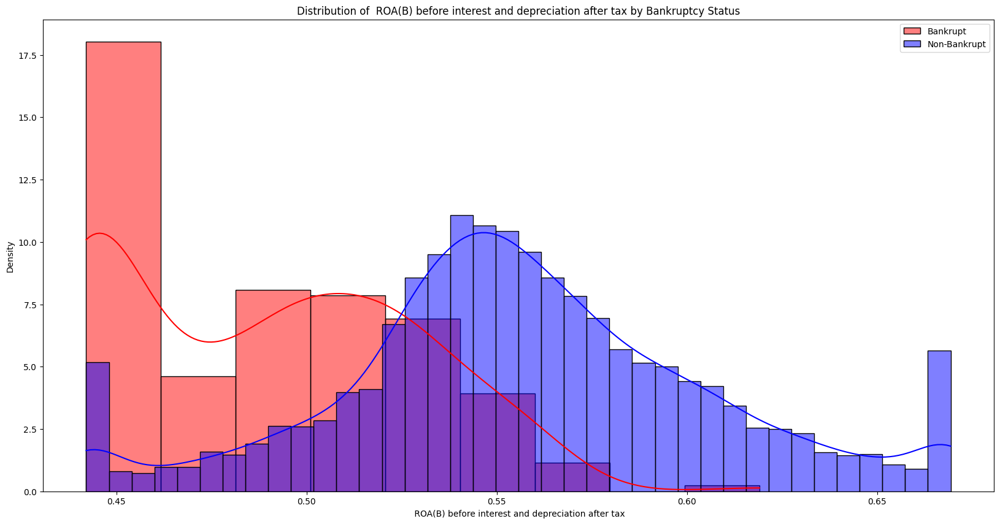

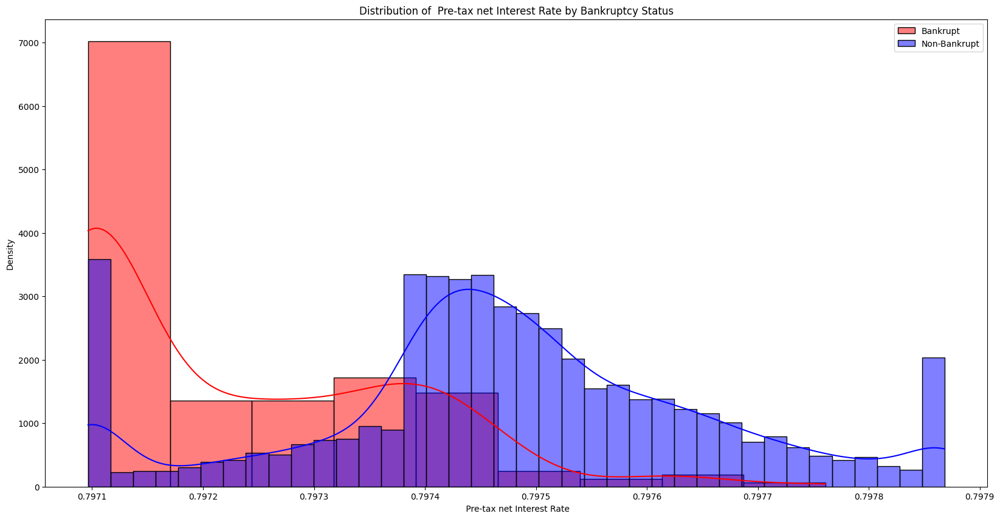

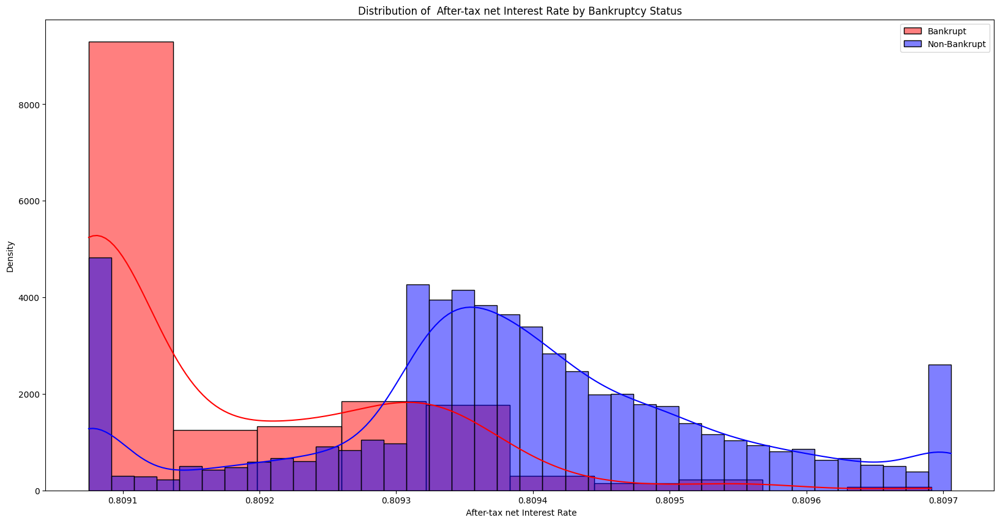

...

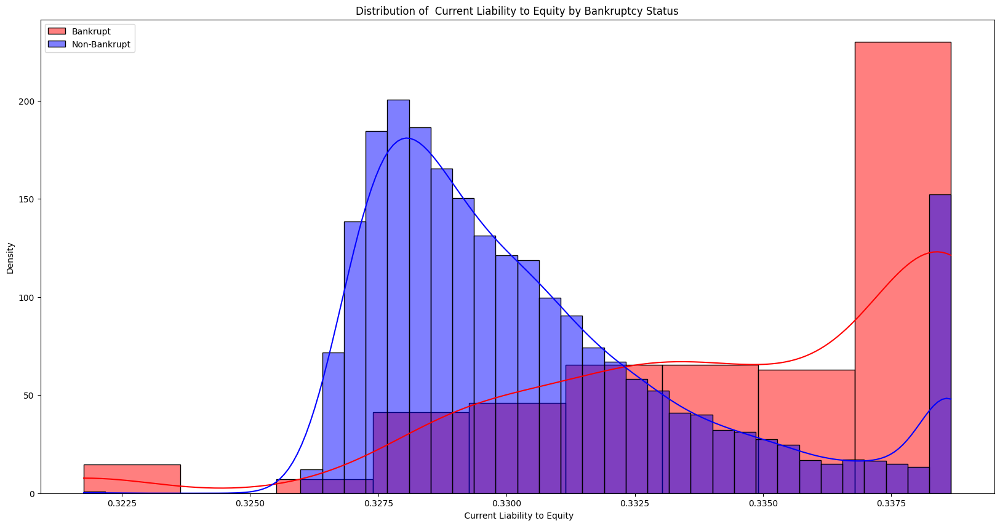

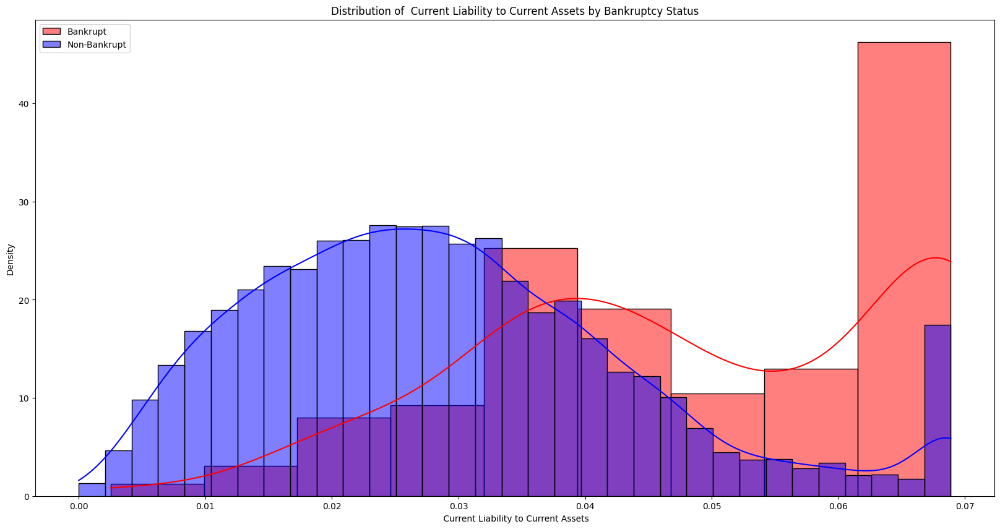

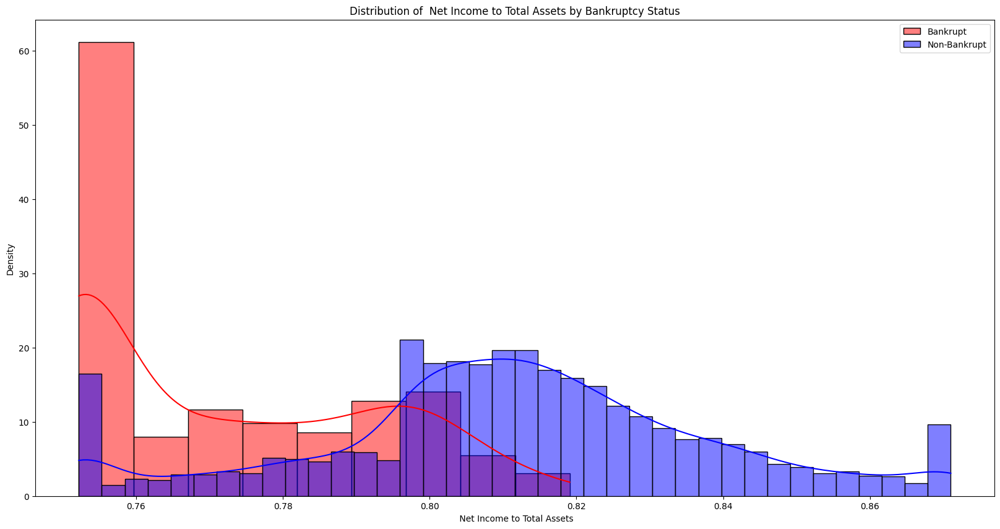

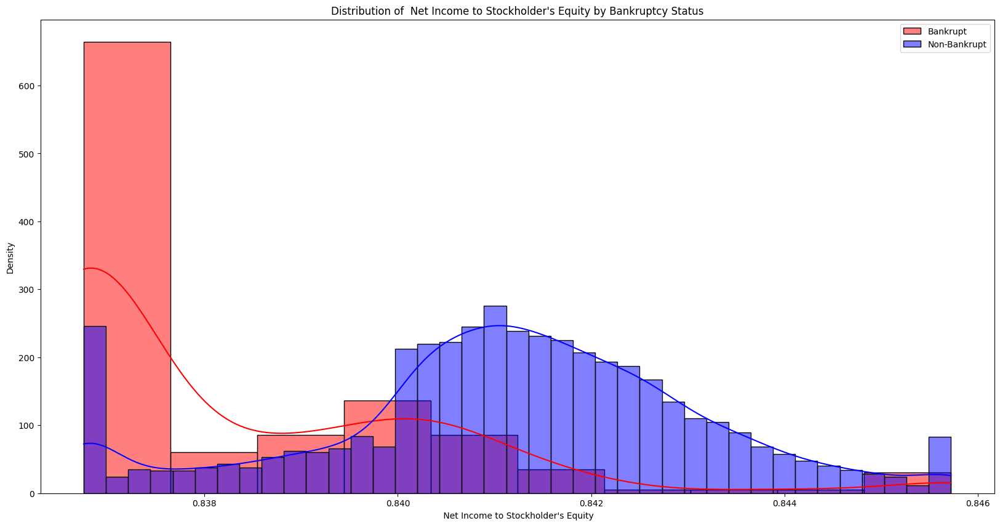

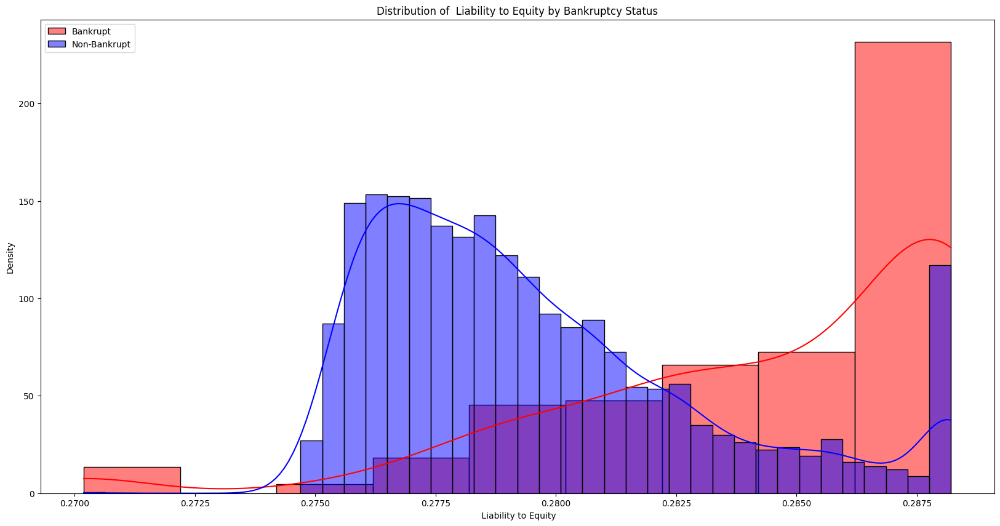

In [221]:
for column in df1.drop(columns=['Bankrupt?']).columns:
    plt.figure(figsize=(20, 10))
    
    # KDE plot for bankrupt companies
    sns.histplot(df_bankrupt[column], kde=True, color='r', label='Bankrupt', stat='density')
    
    # KDE plot for non-bankrupt companies
    sns.histplot(df_non_bankrupt[column], kde=True, color='b', label='Non-Bankrupt', stat='density')
    
    plt.title(f'Distribution of {column} by Bankruptcy Status')
    plt.xlabel(column)
    plt.legend()
    plt.show()

# Interpret model coefficients to understand feature impact.

In [222]:
# Get coefficients and corresponding feature names
coefficients = pd.DataFrame({
    'Feature': x_train.columns,
    'Coefficient': model.coef_[0]
})

# Sort coefficients by absolute value to see the most impactful features
coefficients['Absolute Coefficient'] = coefficients['Coefficient'].abs()
coefficients = coefficients.sort_values(by='Absolute Coefficient', ascending=False)

print("Top Coefficients:")
print(coefficients.head(10))  # Adjust the number as needed


Top Coefficients:
                                              Feature  Coefficient  \
14                                       Debt ratio %     9.903023   
15                                   Net worth/Assets    -9.900043   
0    ROA(C) before interest and depreciation befor...    -7.695392   
2    ROA(B) before interest and depreciation after...    -6.140991   
23                         Net Income to Total Assets    -5.161068   
1              ROA(A) before interest and % after tax    -5.096796   
10            Persistent EPS in the Last Four Seasons    -5.035483   
22                Current Liability to Current Assets     4.295551   
17              Net profit before tax/Paid-in capital    -3.931445   
11           Per Share Net profit before tax (Yuan ¥)    -3.901614   

    Absolute Coefficient  
14              9.903023  
15              9.900043  
0               7.695392  
2               6.140991  
23              5.161068  
1               5.096796  
10              5.0354

- Feature Impact: The coefficients (model.coef_[0]) indicate which features have the most influence on predicting bankruptcy risk. Features with larger coefficients (positive or negative) are more influential in determining whether a company is likely to go bankrupt.

- Class Imbalance: Initially, the dataset showed a significant class imbalance, where non-bankrupt companies outnumbered bankrupt ones. Techniques like SMOTE were used to balance the dataset, improving model performance on minority class predictions.

# Summarize key insights and discuss implications for financial risk management.

- Key Insights and Implications for Financial Risk Management:
Identifying High-Risk Companies: The model identifies companies at high risk of bankruptcy based on influential financial metrics. Features with high positive coefficients highlight areas needing closer scrutiny.

- Early Warning System: Monitoring these influential metrics allows for early identification of financial distress. This enables proactive measures such as debt restructuring or stricter financial assessments.

- Decision Support: Financial risk managers can use the model's predictions to guide decisions on credit approvals, loan terms, and investment strategies. High-risk companies can receive targeted monitoring and mitigation efforts.

- Resource Allocation: Allocate resources effectively by focusing risk management efforts on companies with the highest predicted bankruptcy risk. This ensures optimal use of resources in mitigating financial risks.

Implementing these strategies enhances risk management practices, strengthens decision-making, and protects against potential financial losses associated with bankruptcies.

# Provide actionable recommendations.

- Early Detection and Monitoring:
Establish an early warning system using influential financial metrics identified by the model. Monitor these metrics regularly to detect signs of financial distress promptly.

- Enhanced Risk Assessment:
Integrate model predictions into credit approval and loan assessment processes. Adjust risk ratings and terms dynamically based on updated risk profiles from the model.

- Proactive Engagement:
Take proactive measures with high-risk companies, such as renegotiating terms or restructuring debt. Engage early with clients showing increasing bankruptcy risk to mitigate potential losses.

- Continuous Improvement:
Continuously refine the model using new data and validate predictions against actual bankruptcy cases. Ensure ongoing training for staff on interpreting and using the model effectively.